# MNISTでAuto Encoder

## moduleのimport

In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
import numpy as np
import torch.nn as nn
import torch.nn.functional as F

## データの前処理に使うtransform

In [2]:
transform = transforms.Compose(
    [transforms.ToTensor(),
     ])

## torchvisionからデータをダウンロードし、transformで前処理

In [3]:
#データをtorchvisionでダウンロード
dataset = torchvision.datasets.MNIST(root='./data', train=True,
                                        download=True, transform=transform)

## DataLoaderの定義

In [4]:
import numpy as np
batch_size = 128

#データローダー
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                          shuffle=True, num_workers=6)

## ネットワーク：Encoderの定義

In [5]:
class Encoder(nn.Module):
    def __init__(self, input_dim, z_dim):
        super(Encoder, self).__init__()
        self.input_dim = input_dim
                
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, int(input_dim/2)),
            nn.BatchNorm1d(int(input_dim/2)),
            nn.LeakyReLU(0.2),
            nn.Linear(int(input_dim/2), int(input_dim/4)),
            nn.BatchNorm1d(int(input_dim/4)),
            nn.LeakyReLU(0.2),
            nn.Linear(int(input_dim/4), int(input_dim/8)),
            nn.BatchNorm1d(int(input_dim/8)),
            nn.LeakyReLU(0.2),
            nn.Linear(int(input_dim/8), z_dim),
        )
        
        self.init_weights()
        
    def init_weights(self):
        for module in self.modules():
            if isinstance(module, nn.Linear):
                nn.init.kaiming_uniform_(module.weight) #Heの初期値
                #nn.init.xavier_uniform_(module.weight) #xavierの初期値
                module.bias.data.zero_()
                
    def forward(self, input_data):
        x = input_data.view(-1, self.input_dim)
        x = self.encoder(x)
        return x


## ネットワーク：Decoderの定義

In [6]:
class Decoder(nn.Module):
    def __init__(self, z_dim, output_dim):
        super(Decoder, self).__init__()
        
        self.decoder = nn.Sequential(
            nn.Linear(z_dim, int(output_dim/8)),
            nn.BatchNorm1d(int(output_dim/8)),
            nn.LeakyReLU(0.2),
            nn.Linear(int(output_dim/8), int(output_dim/4)),
            nn.BatchNorm1d(int(output_dim/4)),
            nn.LeakyReLU(0.2),
            nn.Linear(int(output_dim/4), int(output_dim/2)),
            nn.BatchNorm1d(int(output_dim/2)),
            nn.LeakyReLU(0.2),
            nn.Linear(int(output_dim/2), output_dim),
        )
        
        self.init_weights()
       
    def init_weights(self):
        for module in self.modules():
            if isinstance(module, nn.Linear):
                nn.init.kaiming_uniform_(module.weight) #Heの初期値
                #nn.init.xavier_uniform_(module.weight) #xavierの初期値
                module.bias.data.zero_()
                
    def forward(self, z):
        x = self.decoder(z)
        x = x.view(-1, 28, 28)
        return x

## 1エポックごとに計算する関数を定義

In [7]:
#device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def train_func(Encoder, Decoder, batch_size, criterion, optimizer, dataloader, device):
    #訓練モード
    Encoder.train()
    Decoder.train()
    
    #lossの初期化
    run_loss = 0
    
    #バッチごとの計算
    for batch_idx, (data, labels) in enumerate(dataloader):
        #バッチサイズに満たない場合は無視
        if data.size()[0] != batch_size:
            break
        
        img = data.to(device)
        
        optimizer.zero_grad()
        
        #順伝播
        z = Encoder(img)
        output = Decoder(z)
        
        #loss計算
        loss = criterion(img.squeeze(), output)
        loss.backward()
        optimizer.step()
        run_loss += loss
        
    run_loss /= len(dataloader)
    
    return run_loss

## Decoderの出力を可視化

In [8]:
import os
from IPython.display import Image
from torchvision.utils import save_image
%matplotlib inline

def Generate_img(epoch, Encoder, Decoder, device, dataloader, log_dir = 'logs_AE'):
    Encoder.eval()
    Decoder.eval()
    
    with torch.no_grad():
        #サンプル生成
        for (data, label) in dataloader:
            img = data.to(device)
            x = Encoder(img)
            sample = Decoder(x).data.cpu()
            sample = sample.view([128,1,28,28])
            save_image(sample, os.path.join(log_dir, 'epoch_%05d.png' % (epoch)), nrow=16)
            img = Image('logs_AE/epoch_%05d.png' % (epoch))
            display(img)
            break

## モデルをエポックごとに計算し、結果を表示

In [9]:
import time
#import adabound
import random
import numpy as np
import torch.optim as optim

#再現性確保のためseed値固定
SEED = 1111
random.seed(SEED)
np.random.seed(SEED) 
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

def model_run(num_epochs, batch_size = batch_size, dataloader = dataloader, device = device):
    #パラメータ
    input_dim = 28*28
    z_dim = 2
    
    #モデル定義
    E = Encoder(input_dim, z_dim).to(device)
    D = Decoder(z_dim, input_dim).to(device)
    
    #lossの定義
    criterion = nn.MSELoss().to(device)
    
    #optimizerの定義
    #optimizer = torch.optim.SGD(list(E.parameters()) + list(D.parameters()), lr=0.01)
    optimizer = torch.optim.Adam(list(E.parameters()) + list(D.parameters()), lr=0.002, betas=(0.5, 0.999), eps=1e-08, weight_decay=0, amsgrad=False)
    
    loss_list = []
    
    for epoch in range(num_epochs):
        start_time = time.time()
        
        run_loss = train_func(E, D, batch_size, criterion, optimizer, dataloader, device)
        loss_list.append(run_loss)
        
        secs = int(time.time() - start_time)
        mins = secs / 60
        secs = secs % 60
        
        #エポックごとに結果を表示
        print('Epoch: %d' %(epoch + 1), " | 所要時間 %d 分 %d 秒" %(mins, secs))
        print(f'\tLoss: {run_loss:.4f}')

        Generate_img(epoch, E, D, device, dataloader, log_dir = 'logs_AE')
        
    return loss_list, E, D

Epoch: 1  | 所要時間 0 分 2 秒
	Loss: 0.0613


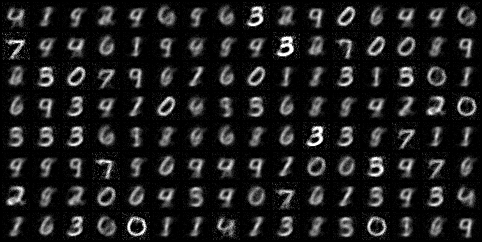

Epoch: 2  | 所要時間 0 分 2 秒
	Loss: 0.0486


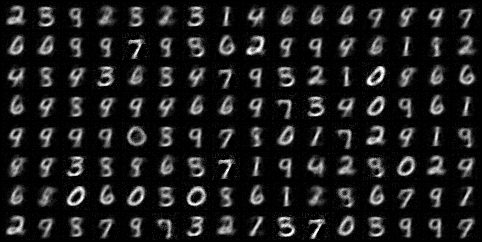

Epoch: 3  | 所要時間 0 分 2 秒
	Loss: 0.0463


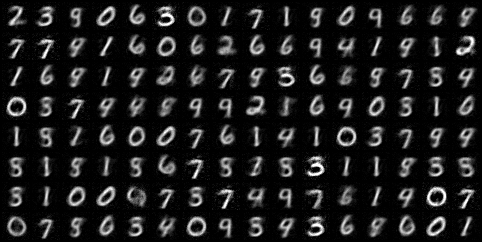

Epoch: 4  | 所要時間 0 分 2 秒
	Loss: 0.0446


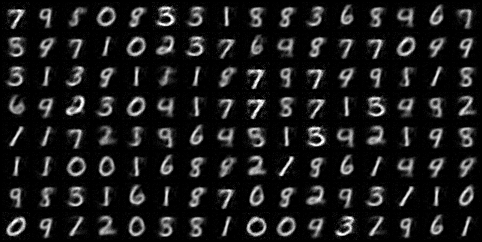

Epoch: 5  | 所要時間 0 分 2 秒
	Loss: 0.0436


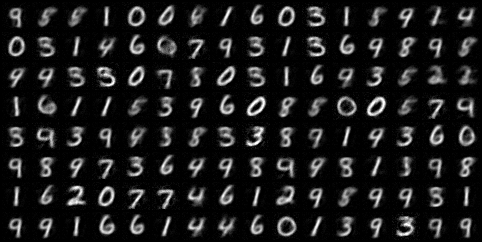

Epoch: 6  | 所要時間 0 分 2 秒
	Loss: 0.0428


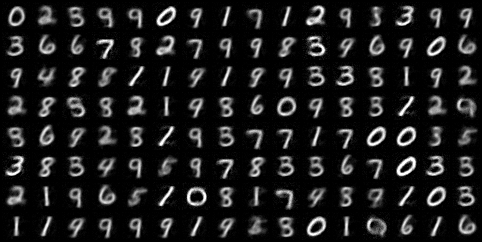

Epoch: 7  | 所要時間 0 分 2 秒
	Loss: 0.0422


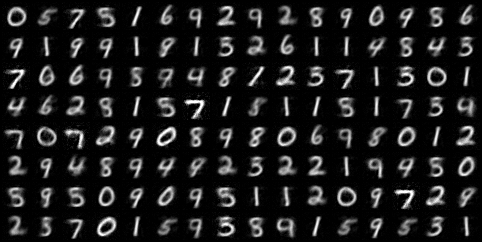

Epoch: 8  | 所要時間 0 分 2 秒
	Loss: 0.0418


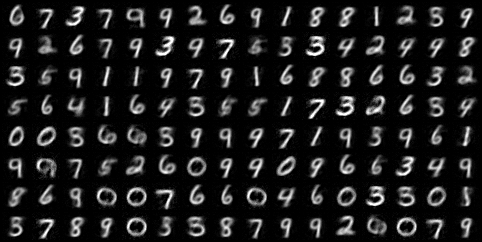

Epoch: 9  | 所要時間 0 分 2 秒
	Loss: 0.0414


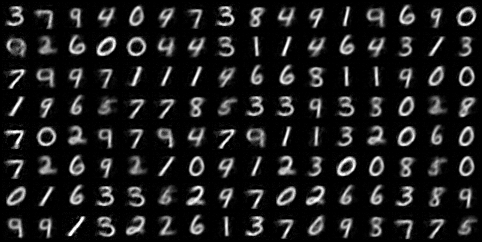

Epoch: 10  | 所要時間 0 分 2 秒
	Loss: 0.0410


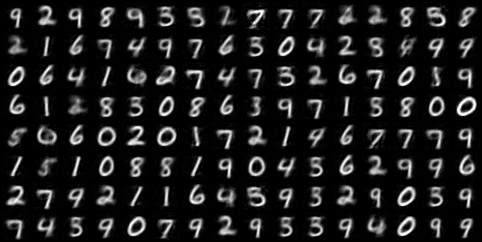

Epoch: 11  | 所要時間 0 分 2 秒
	Loss: 0.0407


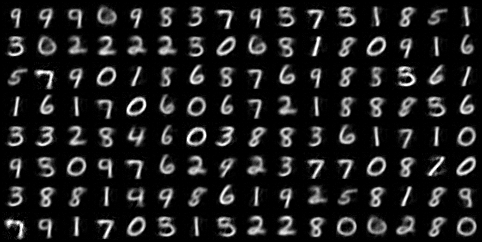

Epoch: 12  | 所要時間 0 分 2 秒
	Loss: 0.0404


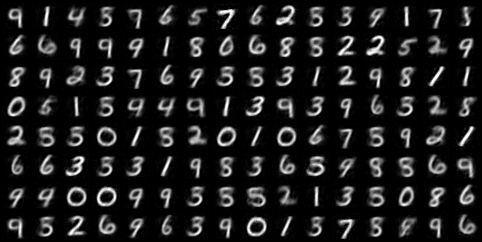

Epoch: 13  | 所要時間 0 分 2 秒
	Loss: 0.0402


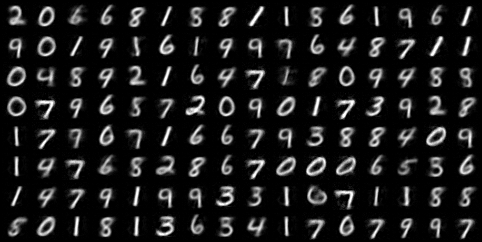

Epoch: 14  | 所要時間 0 分 2 秒
	Loss: 0.0399


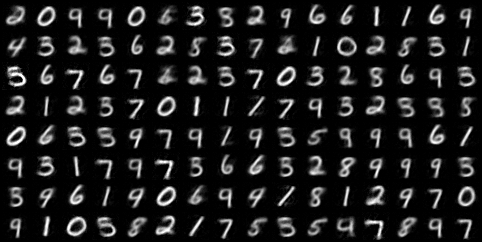

Epoch: 15  | 所要時間 0 分 2 秒
	Loss: 0.0396


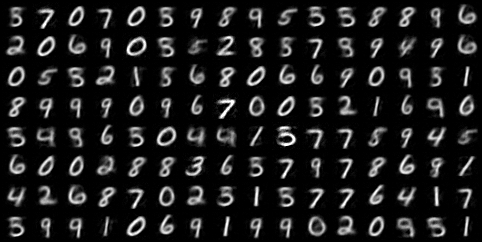

Epoch: 16  | 所要時間 0 分 2 秒
	Loss: 0.0394


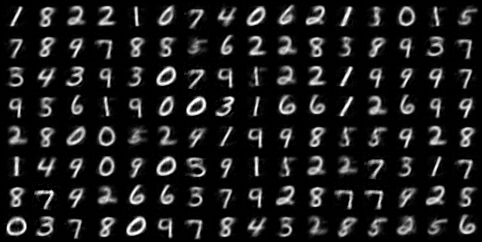

Epoch: 17  | 所要時間 0 分 2 秒
	Loss: 0.0393


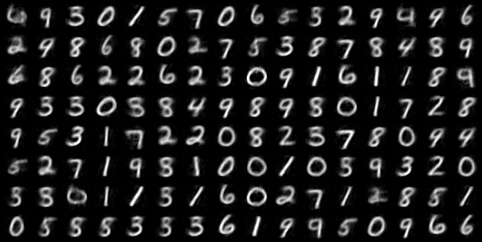

Epoch: 18  | 所要時間 0 分 2 秒
	Loss: 0.0391


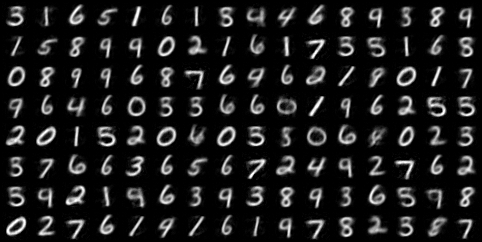

Epoch: 19  | 所要時間 0 分 2 秒
	Loss: 0.0389


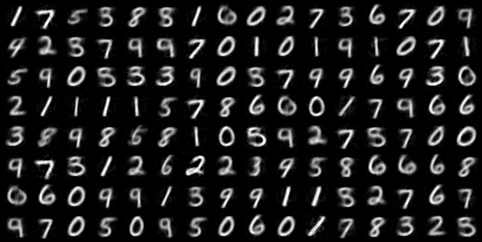

Epoch: 20  | 所要時間 0 分 2 秒
	Loss: 0.0387


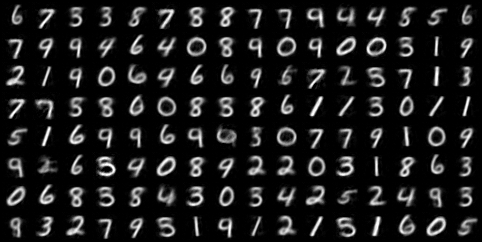

Epoch: 21  | 所要時間 0 分 2 秒
	Loss: 0.0386


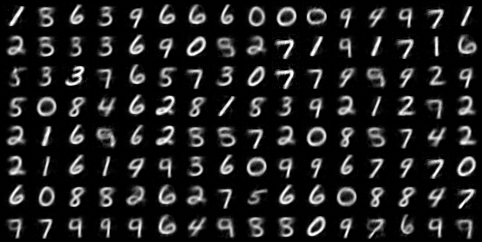

Epoch: 22  | 所要時間 0 分 2 秒
	Loss: 0.0384


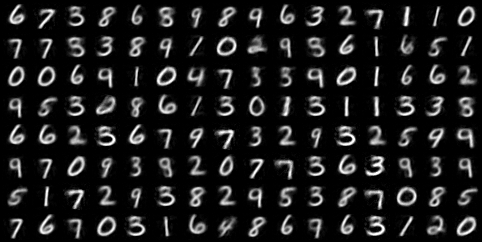

Epoch: 23  | 所要時間 0 分 2 秒
	Loss: 0.0383


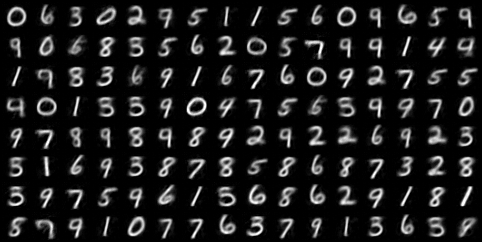

Epoch: 24  | 所要時間 0 分 2 秒
	Loss: 0.0382


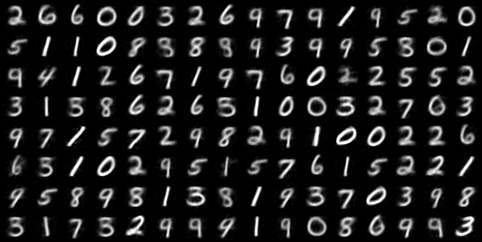

Epoch: 25  | 所要時間 0 分 2 秒
	Loss: 0.0380


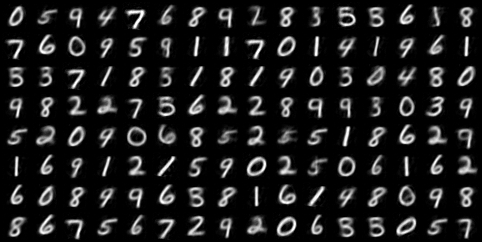

Epoch: 26  | 所要時間 0 分 2 秒
	Loss: 0.0379


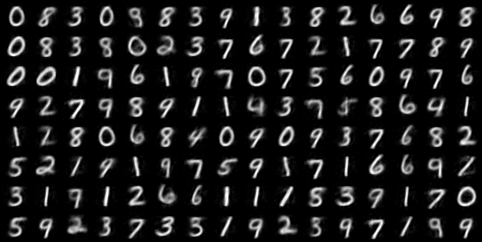

Epoch: 27  | 所要時間 0 分 2 秒
	Loss: 0.0379


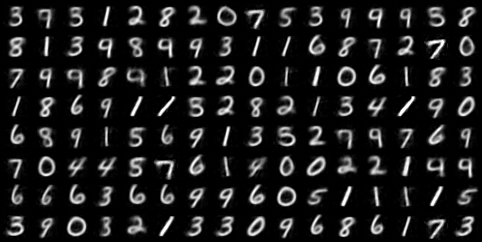

Epoch: 28  | 所要時間 0 分 2 秒
	Loss: 0.0377


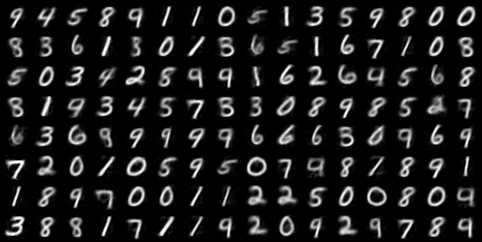

Epoch: 29  | 所要時間 0 分 2 秒
	Loss: 0.0376


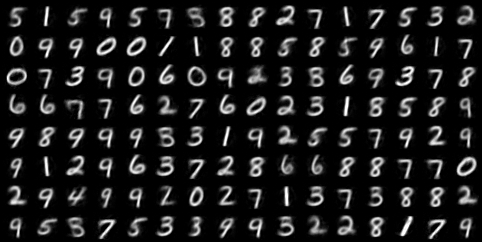

Epoch: 30  | 所要時間 0 分 2 秒
	Loss: 0.0375


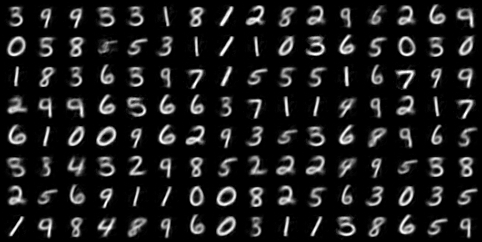

Epoch: 31  | 所要時間 0 分 2 秒
	Loss: 0.0375


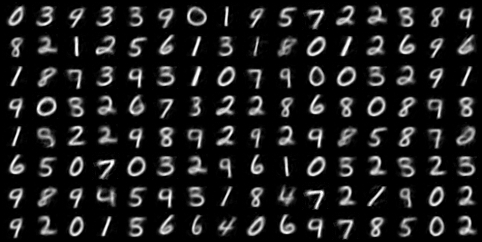

Epoch: 32  | 所要時間 0 分 2 秒
	Loss: 0.0373


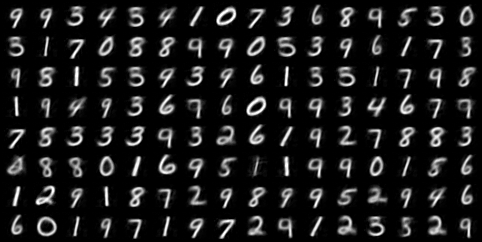

Epoch: 33  | 所要時間 0 分 2 秒
	Loss: 0.0373


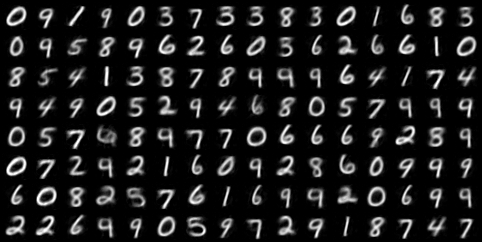

Epoch: 34  | 所要時間 0 分 2 秒
	Loss: 0.0372


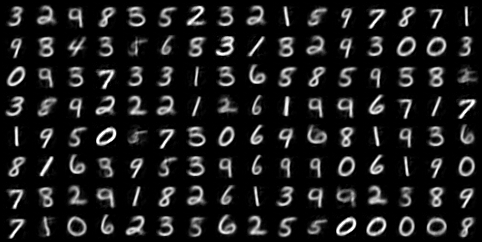

Epoch: 35  | 所要時間 0 分 2 秒
	Loss: 0.0371


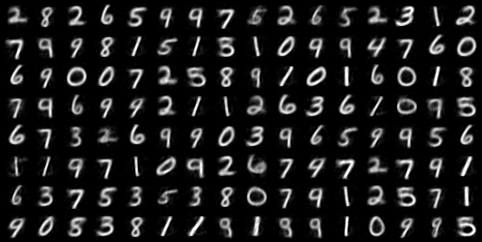

Epoch: 36  | 所要時間 0 分 2 秒
	Loss: 0.0370


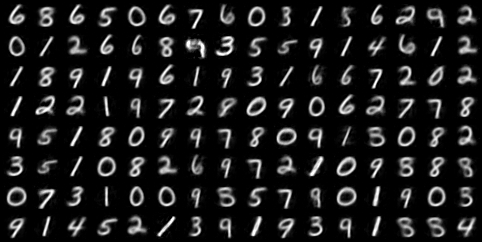

Epoch: 37  | 所要時間 0 分 2 秒
	Loss: 0.0369


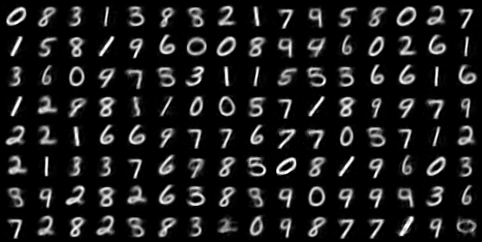

Epoch: 38  | 所要時間 0 分 2 秒
	Loss: 0.0369


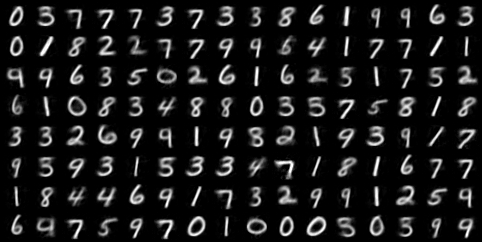

Epoch: 39  | 所要時間 0 分 2 秒
	Loss: 0.0368


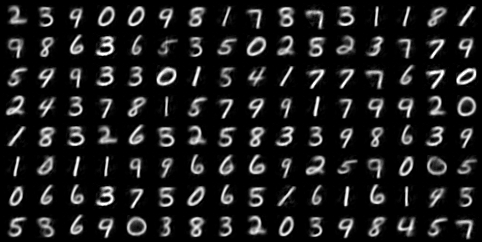

Epoch: 40  | 所要時間 0 分 2 秒
	Loss: 0.0368


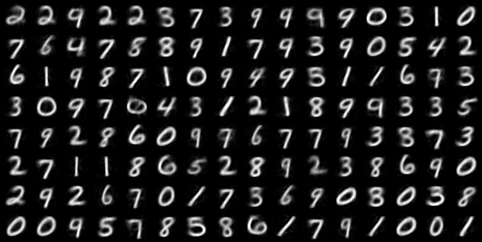

Epoch: 41  | 所要時間 0 分 2 秒
	Loss: 0.0367


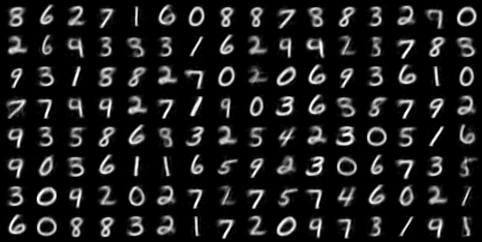

Epoch: 42  | 所要時間 0 分 2 秒
	Loss: 0.0367


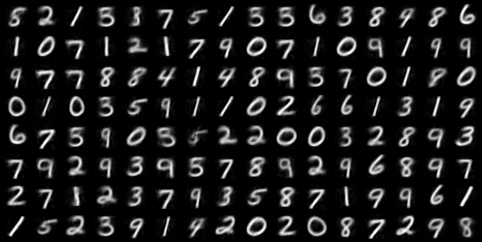

Epoch: 43  | 所要時間 0 分 2 秒
	Loss: 0.0366


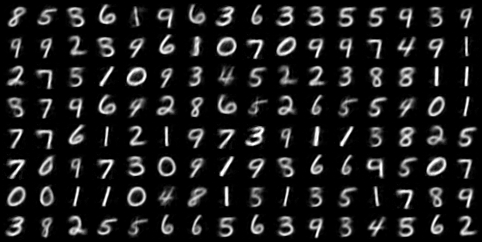

Epoch: 44  | 所要時間 0 分 2 秒
	Loss: 0.0365


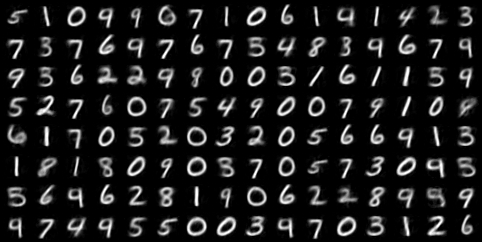

Epoch: 45  | 所要時間 0 分 2 秒
	Loss: 0.0365


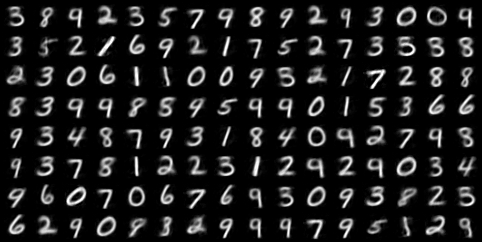

Epoch: 46  | 所要時間 0 分 2 秒
	Loss: 0.0364


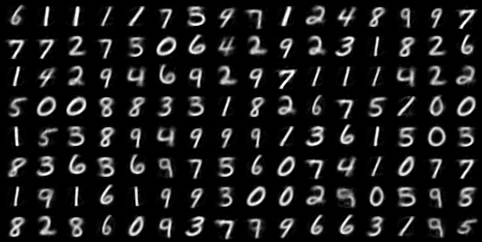

Epoch: 47  | 所要時間 0 分 2 秒
	Loss: 0.0363


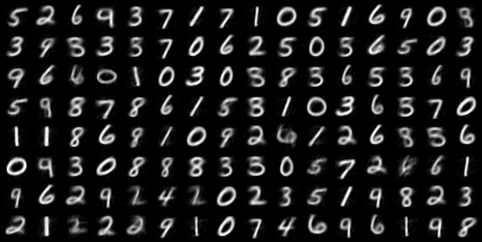

Epoch: 48  | 所要時間 0 分 2 秒
	Loss: 0.0363


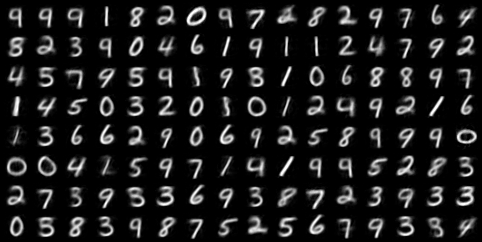

Epoch: 49  | 所要時間 0 分 2 秒
	Loss: 0.0363


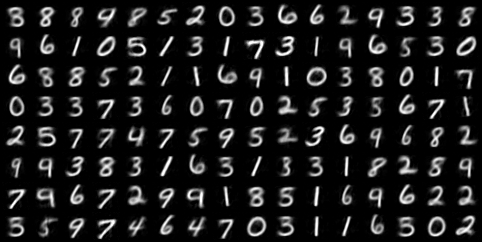

Epoch: 50  | 所要時間 0 分 2 秒
	Loss: 0.0363


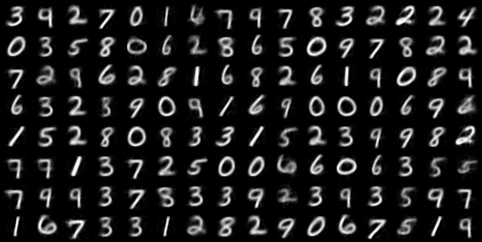

Epoch: 51  | 所要時間 0 分 2 秒
	Loss: 0.0362


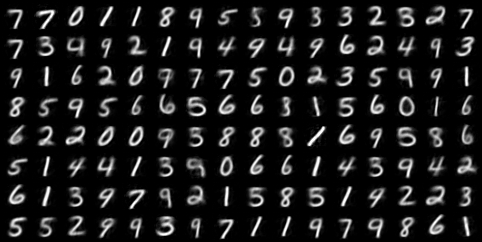

Epoch: 52  | 所要時間 0 分 2 秒
	Loss: 0.0361


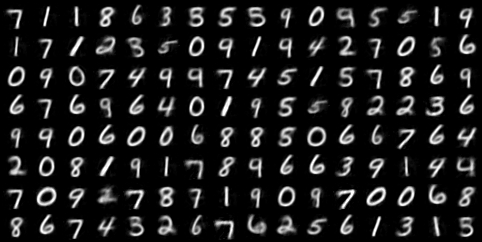

Epoch: 53  | 所要時間 0 分 2 秒
	Loss: 0.0361


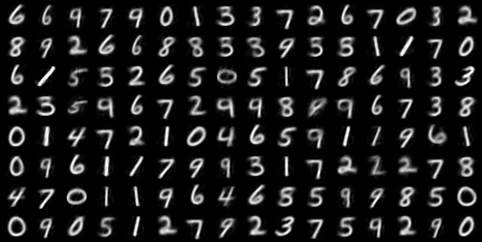

Epoch: 54  | 所要時間 0 分 2 秒
	Loss: 0.0361


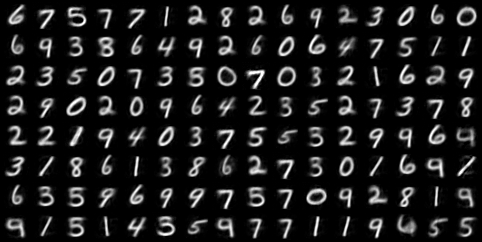

Epoch: 55  | 所要時間 0 分 2 秒
	Loss: 0.0361


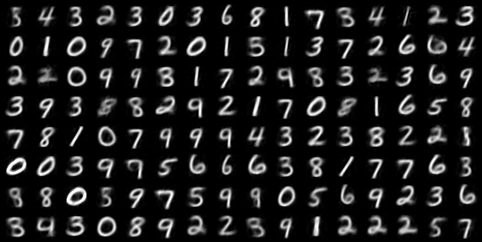

Epoch: 56  | 所要時間 0 分 2 秒
	Loss: 0.0360


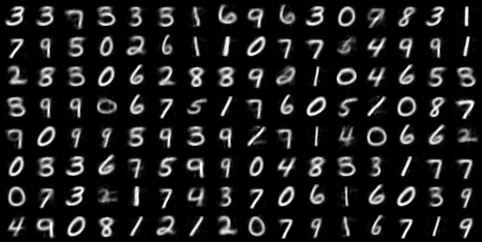

Epoch: 57  | 所要時間 0 分 2 秒
	Loss: 0.0359


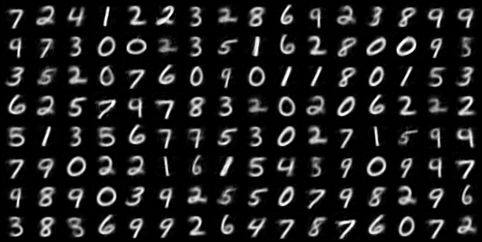

Epoch: 58  | 所要時間 0 分 2 秒
	Loss: 0.0360


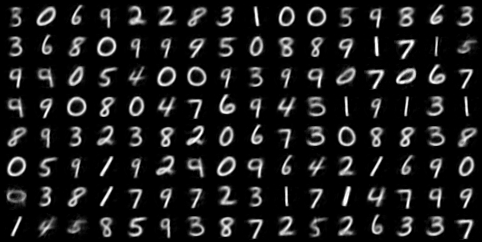

Epoch: 59  | 所要時間 0 分 2 秒
	Loss: 0.0359


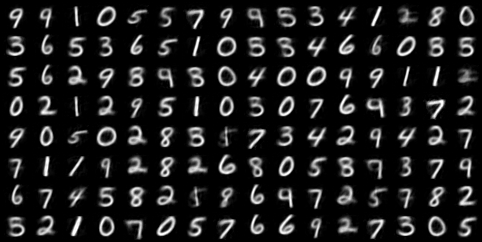

Epoch: 60  | 所要時間 0 分 2 秒
	Loss: 0.0358


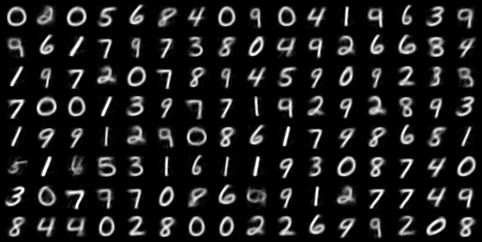

Epoch: 61  | 所要時間 0 分 2 秒
	Loss: 0.0359


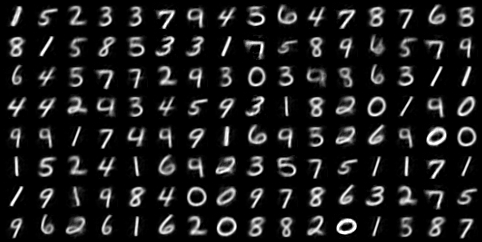

Epoch: 62  | 所要時間 0 分 2 秒
	Loss: 0.0357


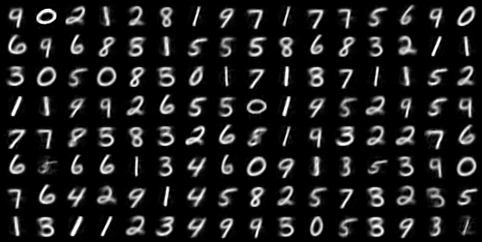

Epoch: 63  | 所要時間 0 分 2 秒
	Loss: 0.0358


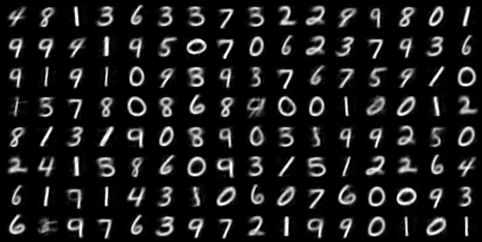

Epoch: 64  | 所要時間 0 分 2 秒
	Loss: 0.0358


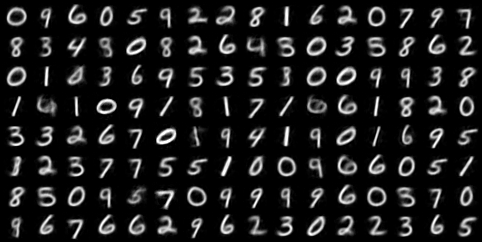

Epoch: 65  | 所要時間 0 分 2 秒
	Loss: 0.0358


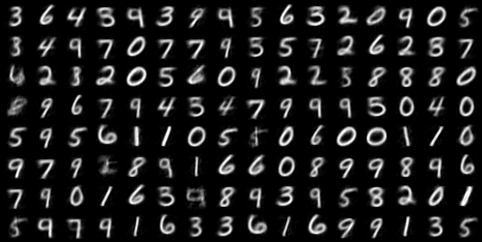

Epoch: 66  | 所要時間 0 分 2 秒
	Loss: 0.0356


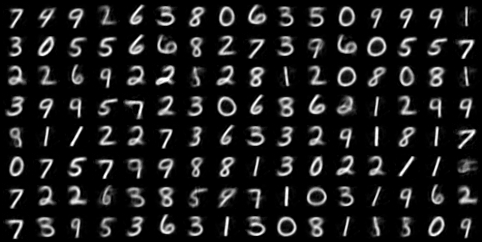

Epoch: 67  | 所要時間 0 分 2 秒
	Loss: 0.0357


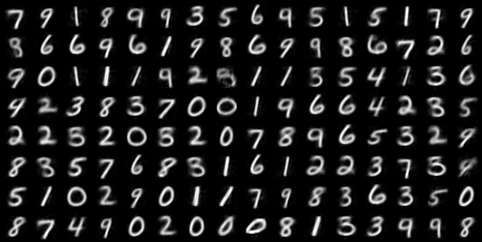

Epoch: 68  | 所要時間 0 分 2 秒
	Loss: 0.0357


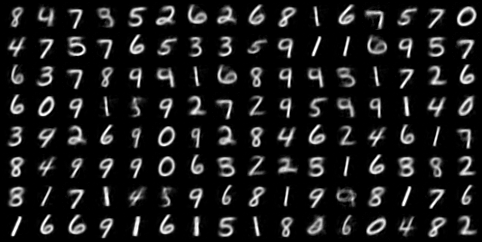

Epoch: 69  | 所要時間 0 分 2 秒
	Loss: 0.0356


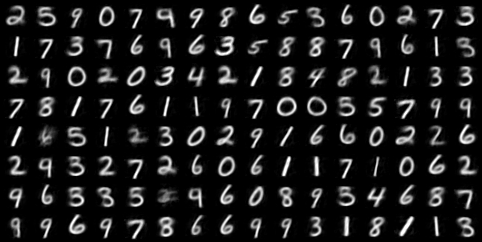

Epoch: 70  | 所要時間 0 分 2 秒
	Loss: 0.0356


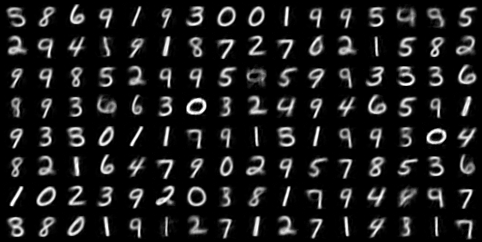

Epoch: 71  | 所要時間 0 分 2 秒
	Loss: 0.0355


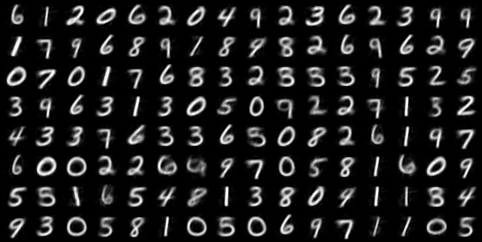

Epoch: 72  | 所要時間 0 分 2 秒
	Loss: 0.0355


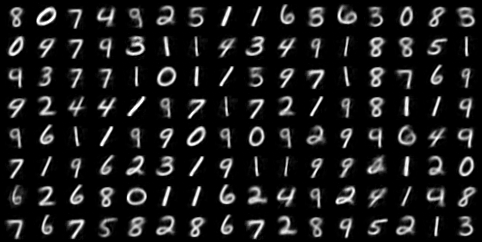

Epoch: 73  | 所要時間 0 分 2 秒
	Loss: 0.0355


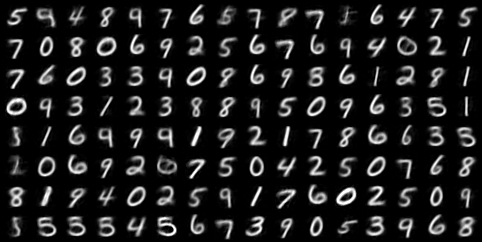

Epoch: 74  | 所要時間 0 分 2 秒
	Loss: 0.0355


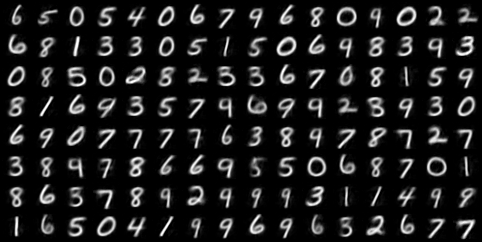

Epoch: 75  | 所要時間 0 分 2 秒
	Loss: 0.0354


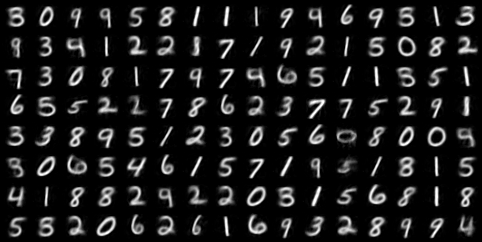

Epoch: 76  | 所要時間 0 分 2 秒
	Loss: 0.0355


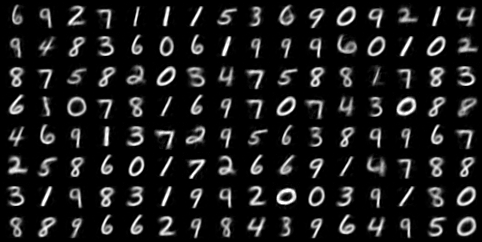

Epoch: 77  | 所要時間 0 分 2 秒
	Loss: 0.0354


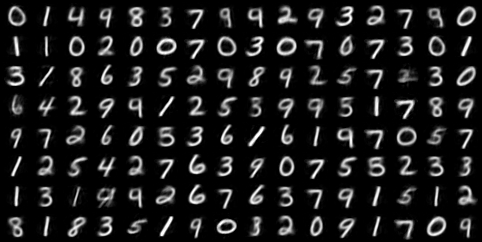

Epoch: 78  | 所要時間 0 分 2 秒
	Loss: 0.0353


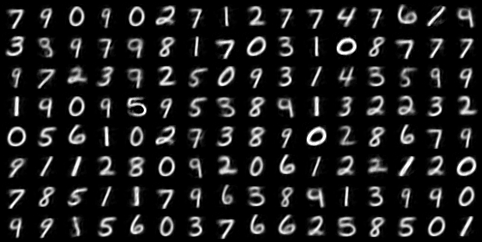

Epoch: 79  | 所要時間 0 分 2 秒
	Loss: 0.0354


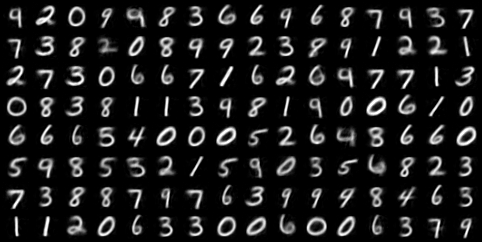

Epoch: 80  | 所要時間 0 分 2 秒
	Loss: 0.0354


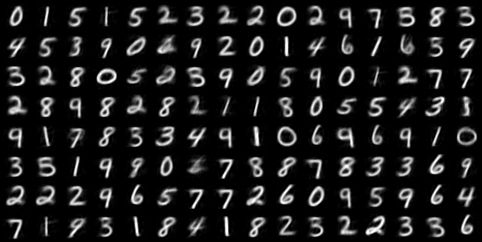

Epoch: 81  | 所要時間 0 分 2 秒
	Loss: 0.0353


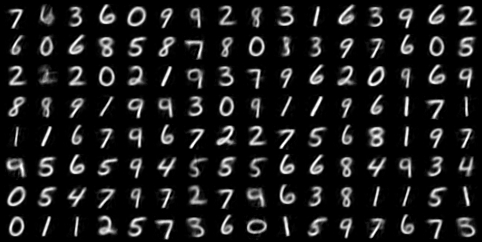

Epoch: 82  | 所要時間 0 分 2 秒
	Loss: 0.0353


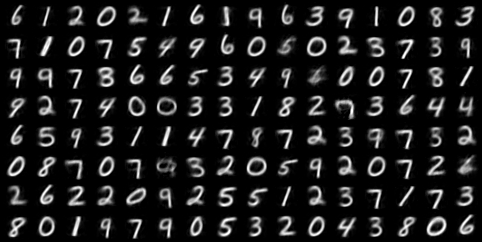

Epoch: 83  | 所要時間 0 分 2 秒
	Loss: 0.0353


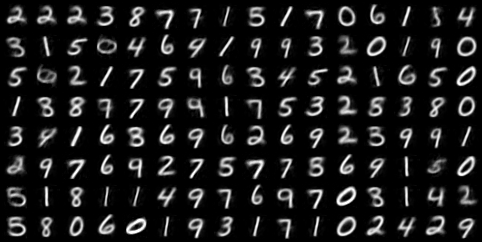

Epoch: 84  | 所要時間 0 分 2 秒
	Loss: 0.0352


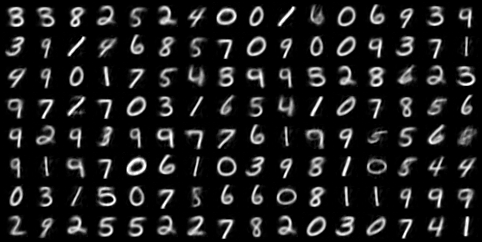

Epoch: 85  | 所要時間 0 分 2 秒
	Loss: 0.0351


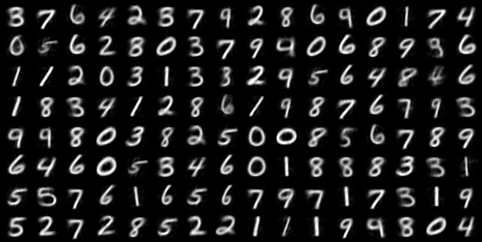

Epoch: 86  | 所要時間 0 分 2 秒
	Loss: 0.0352


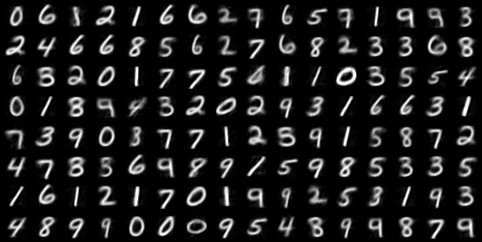

Epoch: 87  | 所要時間 0 分 2 秒
	Loss: 0.0352


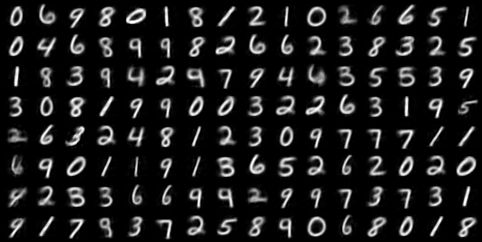

Epoch: 88  | 所要時間 0 分 2 秒
	Loss: 0.0352


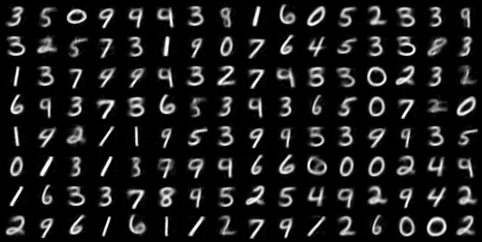

Epoch: 89  | 所要時間 0 分 2 秒
	Loss: 0.0351


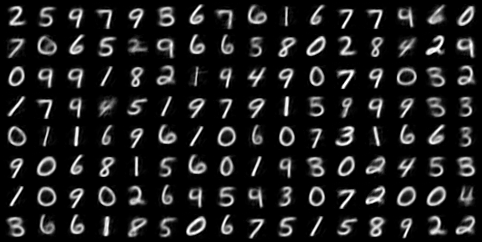

Epoch: 90  | 所要時間 0 分 2 秒
	Loss: 0.0351


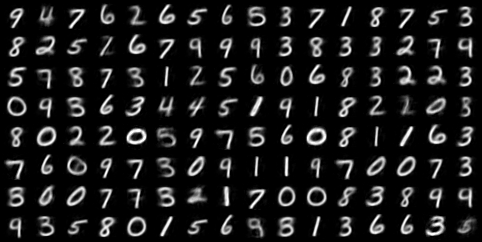

Epoch: 91  | 所要時間 0 分 2 秒
	Loss: 0.0351


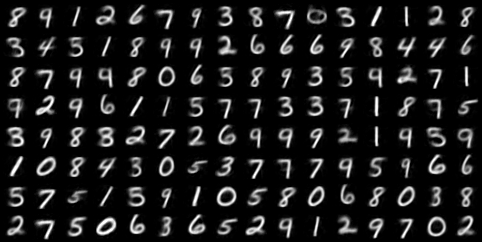

Epoch: 92  | 所要時間 0 分 2 秒
	Loss: 0.0351


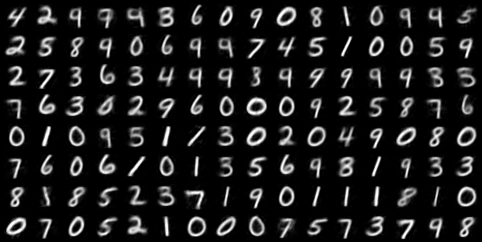

Epoch: 93  | 所要時間 0 分 2 秒
	Loss: 0.0352


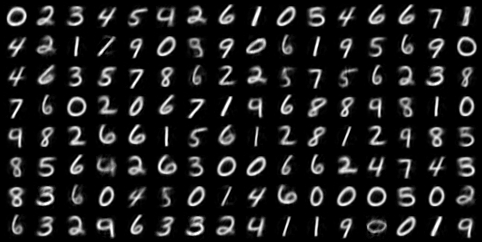

Epoch: 94  | 所要時間 0 分 2 秒
	Loss: 0.0350


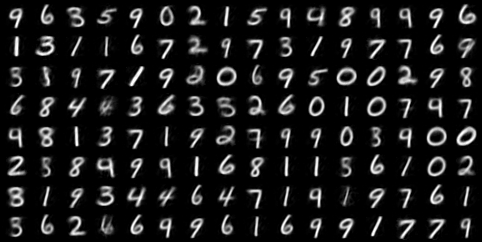

Epoch: 95  | 所要時間 0 分 2 秒
	Loss: 0.0350


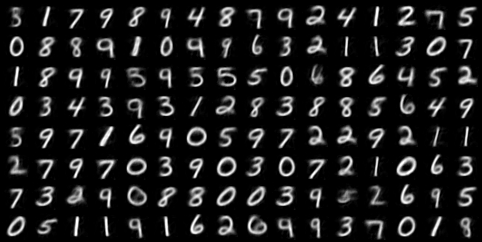

Epoch: 96  | 所要時間 0 分 2 秒
	Loss: 0.0350


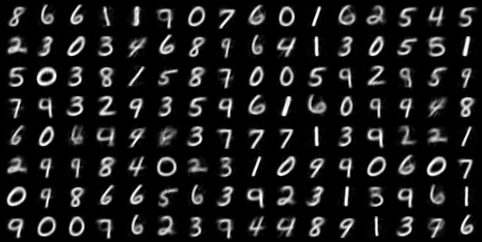

Epoch: 97  | 所要時間 0 分 2 秒
	Loss: 0.0351


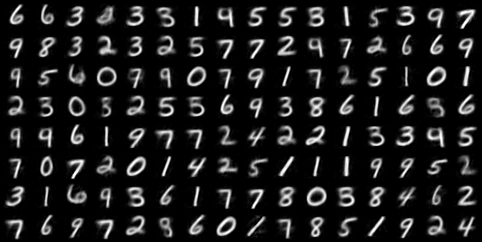

Epoch: 98  | 所要時間 0 分 2 秒
	Loss: 0.0350


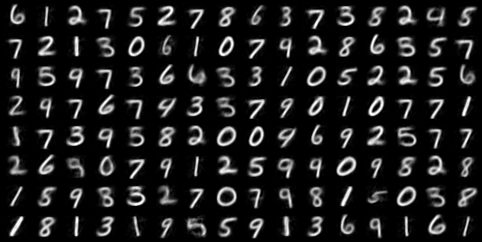

Epoch: 99  | 所要時間 0 分 2 秒
	Loss: 0.0350


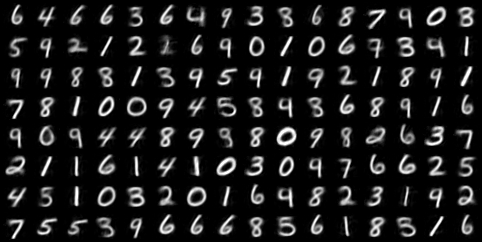

Epoch: 100  | 所要時間 0 分 2 秒
	Loss: 0.0349


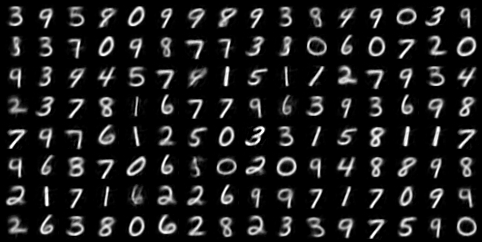

In [10]:
loss_list, E, D = model_run(num_epochs = 100)

## lossを表示

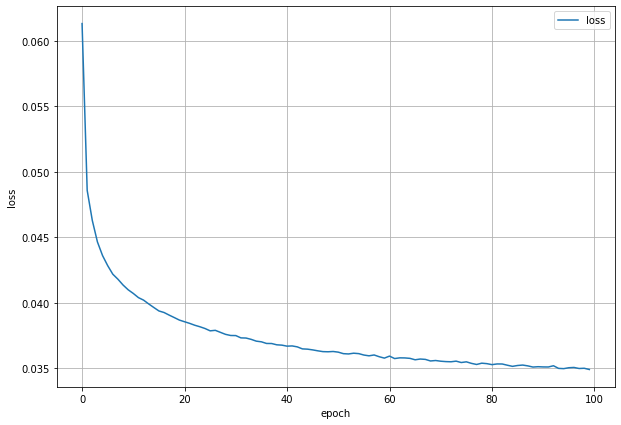

In [11]:
import matplotlib.pyplot as plt
%matplotlib inline

fig = plt.figure(figsize=(10,7))

loss = fig.add_subplot(1,1,1)

loss.plot(range(len(loss_list)),loss_list,label='loss')

loss.set_xlabel('epoch')
loss.set_ylabel('loss')

loss.legend()
loss.grid()

fig.show()

## 符号化した値をプロットして可視化（2次元）

100%|██████████| 60000/60000 [00:22<00:00, 2647.02it/s]


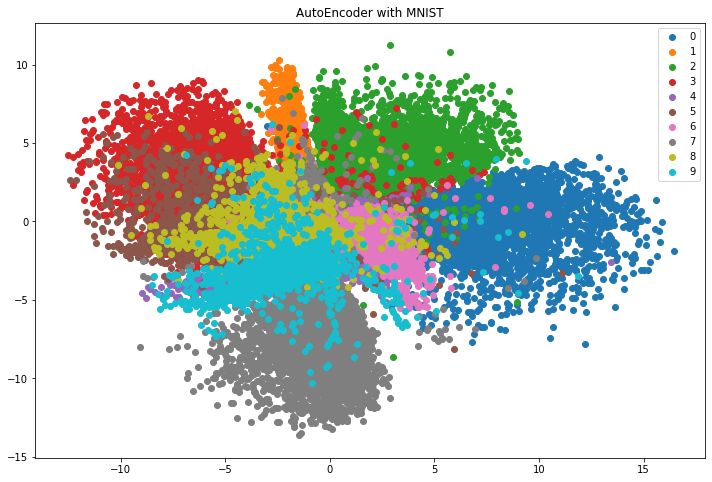

In [12]:
from tqdm import tqdm
import matplotlib.pyplot as plt
%matplotlib inline

x_dict = {0:[],1:[],2:[],3:[],4:[],5:[],6:[],7:[],8:[],9:[]}
y_dict = {0:[],1:[],2:[],3:[],4:[],5:[],6:[],7:[],8:[],9:[]}

for (data, label) in tqdm(dataset):
    img = data.to(device)
    value = E(img).data.cpu()
    x_dict[label].append(value[0][0].item())
    y_dict[label].append(value[0][1].item())
    
fig = plt.figure(figsize=(12,8))
maps = fig.add_subplot(1,1,1)
cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']
for i in range(10):
    maps.scatter(x_dict[i], y_dict[i], color=cycle[i], label='{}'.format(i))
maps.set_title('AutoEncoder with MNIST')
maps.legend()
fig.show()

## 符号化した値をプロットして可視化（3次元）

100%|██████████| 60000/60000 [00:23<00:00, 2562.05it/s]


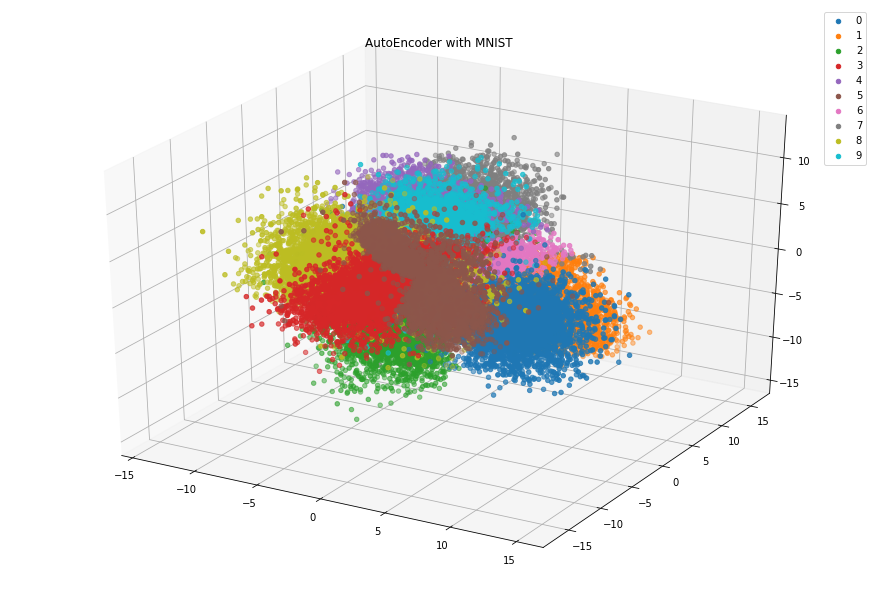

In [85]:
from tqdm import tqdm
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

%matplotlib inline

x_dict = {0:[],1:[],2:[],3:[],4:[],5:[],6:[],7:[],8:[],9:[]}
y_dict = {0:[],1:[],2:[],3:[],4:[],5:[],6:[],7:[],8:[],9:[]}
z_dict = {0:[],1:[],2:[],3:[],4:[],5:[],6:[],7:[],8:[],9:[]}

for (data, label) in tqdm(dataset):
    img = data.to(device)
    value = E(img).data.cpu()
    x_dict[label].append(value[0][0].item())
    y_dict[label].append(value[0][1].item())
    z_dict[label].append(value[0][2].item())
    
fig = plt.figure(figsize=(12,8))
maps = Axes3D(fig)
cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']
for i in range(10):
    maps.scatter(x_dict[i],y_dict[i],z_dict[i], color=cycle[i], label=i)
maps.set_title('AutoEncoder with MNIST')
maps.legend()
fig.show()